In [1]:
import sys
import os
import importlib
# make the module available from the src directory
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [114]:
from src.dataLoaders.DataLoader import DataSetLoader
importlib.reload(sys.modules['src.dataLoaders.DataLoader'])

# 10.000 images, minSize=8, maxSize=20
# dataset = 'SimpleNoisyImageGenerator'
dataset = 'EnhancedNoisyImageGeneratorRandNoiseShape'

data_dir = '../datasets/artificial_data/'

data_loader = DataSetLoader(data_dir=f'{data_dir}{dataset}')
data_loader.load_data()

In [116]:
from src.models.baseModels.resnet_regression import ResNetModel
importlib.reload(sys.modules['src.models.baseModels.resnet_regression'])

<module 'src.models.baseModels.resnet_regression' from 'c:\\Users\\askel\\OneDrive\\Dokumenter\\Projekter\\XAI-in-Medical-Image-Analysis\\src\\models\\baseModels\\resnet_regression.py'>

In [93]:
resnet = ResNetModel(
    data_dir=f'{data_dir}{dataset}', 
    num_epochs=60,
    learning_rate=0.01,
    weight_decay=1e-4,
    early_stopping_tol=30,
    early_stopping_min_delta=30,
    dataLoader=data_loader,
    depth=18,
    # dropout_rate=0.2, 
) 

# resnet.load_data()
resnet.train()
resnet.evaluate()

Is cuda available:  True
Is mps available:  False
Epoch 1/60, Train Loss: 219.9073944091797, Val Loss: 945.4841918945312
Epoch 2/60, Train Loss: 95.64498138427734, Val Loss: 32154294.0
Epoch 3/60, Train Loss: 27.512243270874023, Val Loss: 15712478208.0
Epoch 4/60, Train Loss: 11.229005813598633, Val Loss: 217352524267520.0
Epoch 5/60, Train Loss: 36.479888916015625, Val Loss: 14304159989760.0
Epoch 6/60, Train Loss: 22.346036911010742, Val Loss: 9071098855424.0
Epoch 7/60, Train Loss: 18.20245933532715, Val Loss: 4069699616768.0
Epoch 8/60, Train Loss: 13.548868179321289, Val Loss: 453383225344.0
Epoch 9/60, Train Loss: 11.0489501953125, Val Loss: 37142118400.0
Epoch 10/60, Train Loss: 8.53939437866211, Val Loss: 3118023680.0
Epoch 11/60, Train Loss: 5.650693893432617, Val Loss: 283887936.0
Epoch 12/60, Train Loss: 5.154689311981201, Val Loss: 17732972.0
Epoch 13/60, Train Loss: 3.2669084072113037, Val Loss: 188015.375
Epoch 14/60, Train Loss: 2.793667793273926, Val Loss: 25.6303634643

In [108]:
from src.XAI.GradCam import GradCamResnet
from src.XAI.VanillaSaliency import VanillaSaliency
from src.XAI.GradCamPlusPlus import GradCamPlusPlus
from src.XAI.GuideGradCam import GuidedGradCam
from src.XAI.DeepShap import DeepShapResnet
from src.XAI.utils.BaseXAI import BaseXAI


importlib.reload(sys.modules['src.XAI.utils.SaveFiles'])
importlib.reload(sys.modules['src.XAI.utils.BaseXAI'])

importlib.reload(sys.modules['src.XAI.VanillaSaliency'])
importlib.reload(sys.modules['src.XAI.GradCam'])
importlib.reload(sys.modules['src.XAI.GradCamPlusPlus'])
importlib.reload(sys.modules['src.XAI.GuideGradCam'])
importlib.reload(sys.modules['src.XAI.DeepShap'])

<module 'src.XAI.DeepShap' from 'c:\\Users\\askel\\OneDrive\\Dokumenter\\Projekter\\XAI-in-Medical-Image-Analysis\\src\\XAI\\DeepShap.py'>

In [110]:
vanilla_saliency = VanillaSaliency(resnet)
grad_cam = GradCamResnet(resnet)
grad_cam_plus_plus = GradCamPlusPlus(resnet)
guided_grad_cam = GuidedGradCam(vanilla_saliency=vanilla_saliency, grad_cam=grad_cam)
deep_shap = DeepShapResnet(resnet)

allModels: list[BaseXAI] = [vanilla_saliency, grad_cam, grad_cam_plus_plus, guided_grad_cam, deep_shap]

Image 1


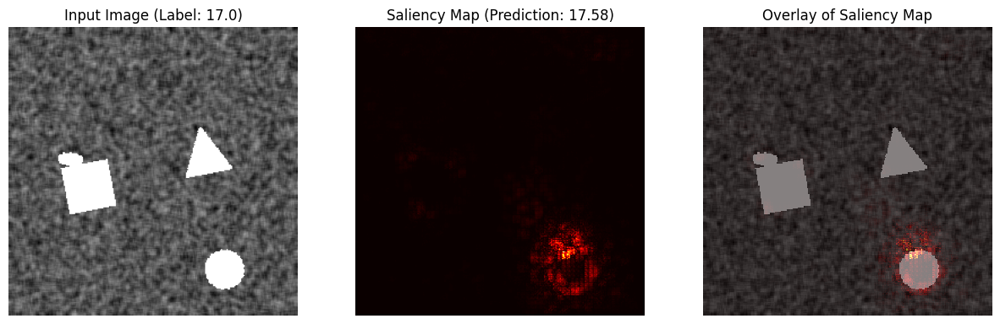

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


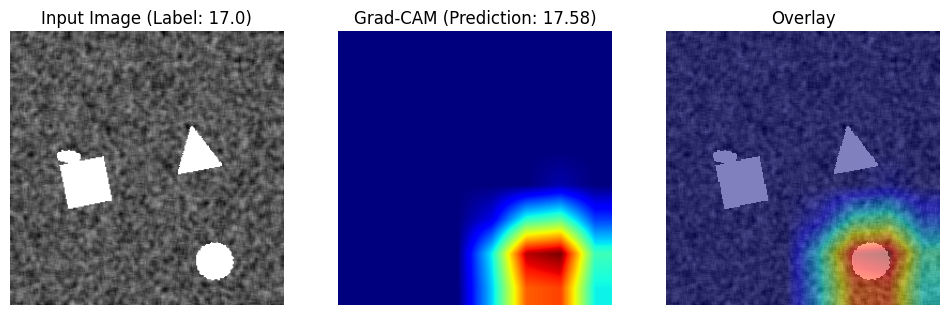

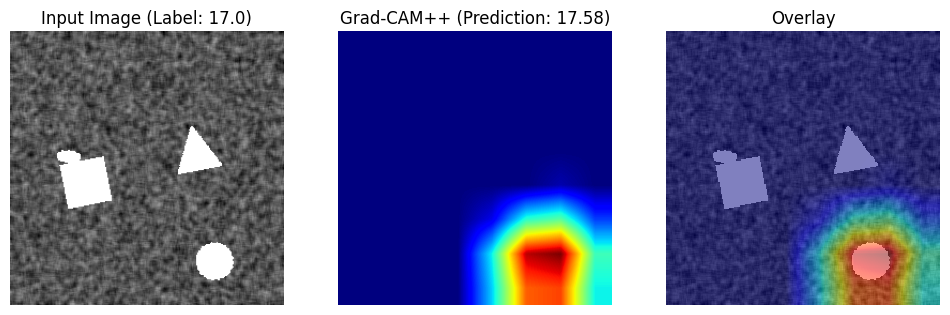

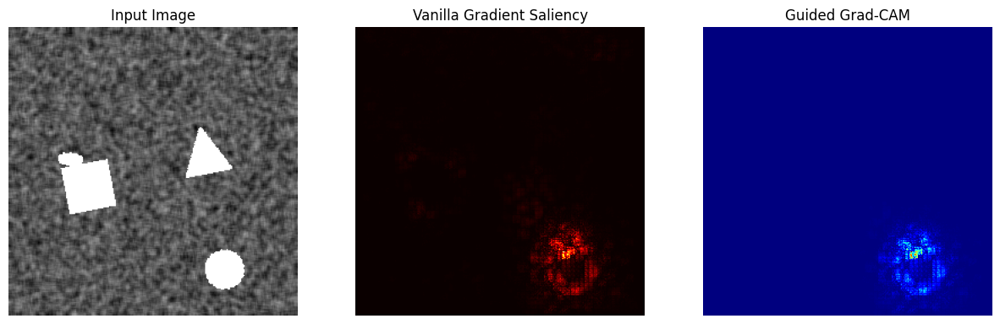

<Figure size 640x480 with 0 Axes>

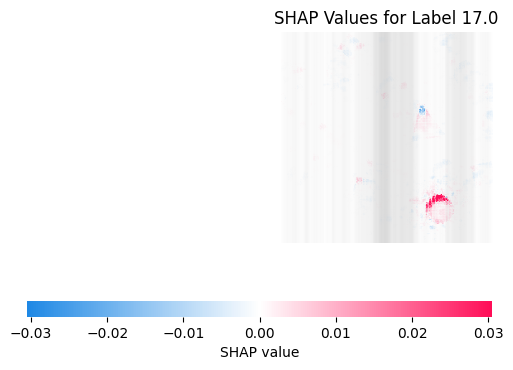

Image 2


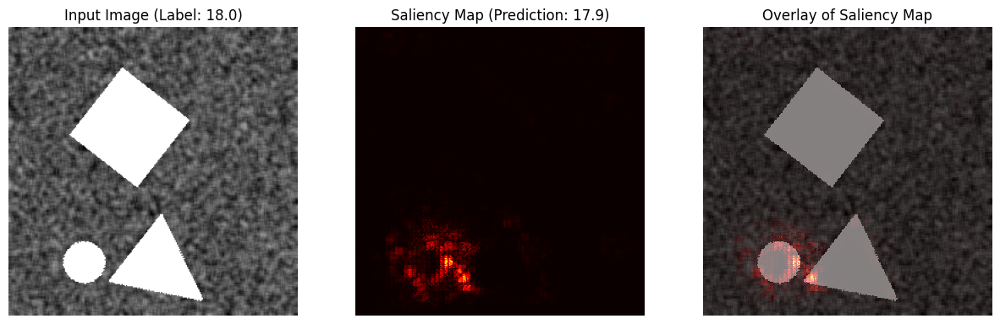

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


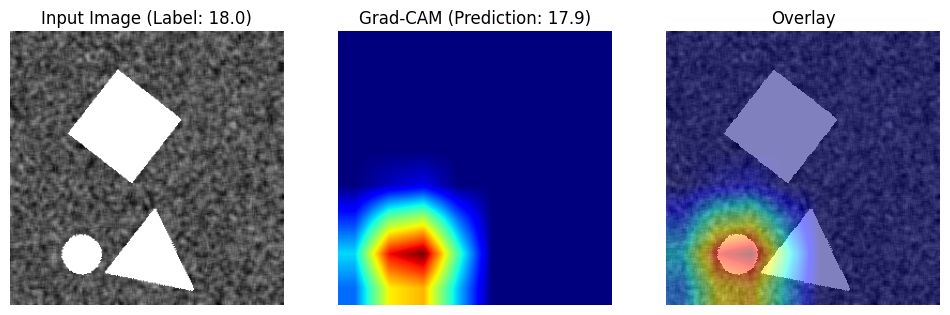

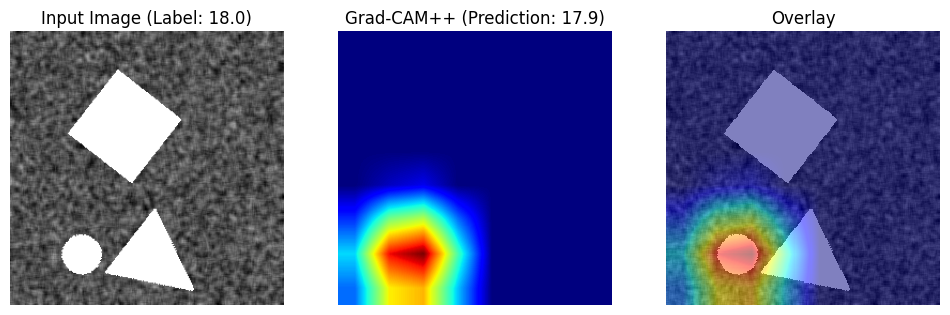

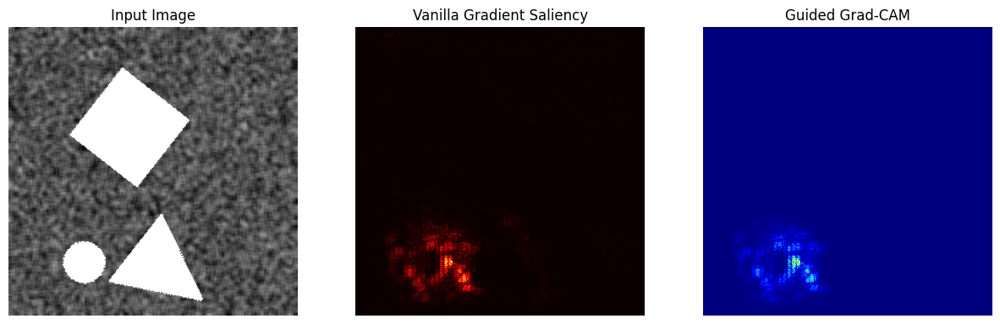

<Figure size 640x480 with 0 Axes>

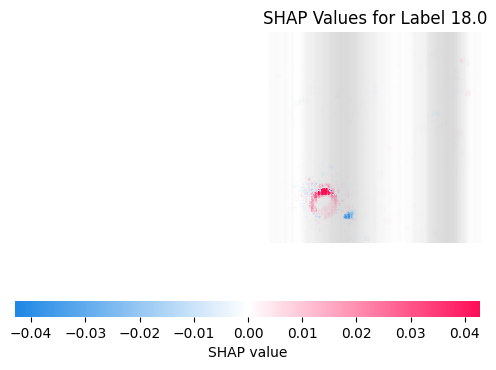

Image 3


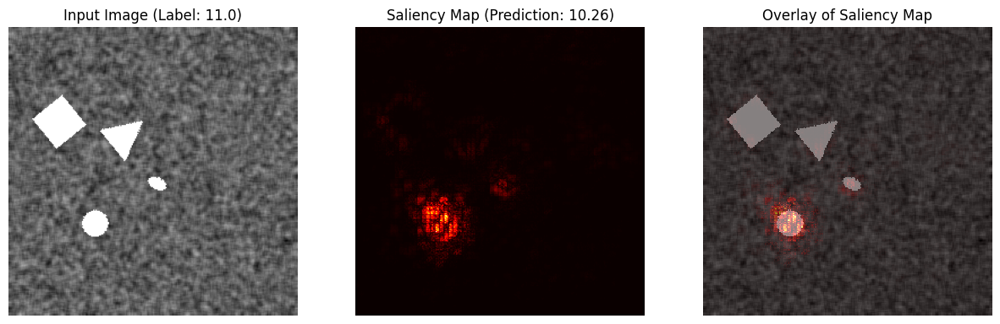

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Min value in heatmap before ReLU is: tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward0>)
Max value in heatmap after ReLU is zero3.


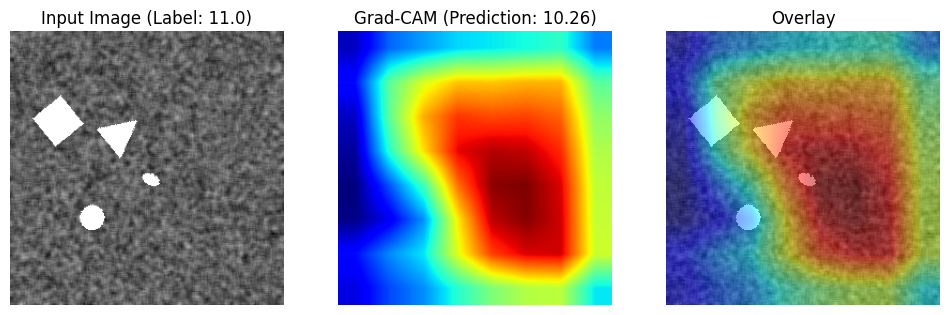

Max value in heatmap after ReLU is zero3.


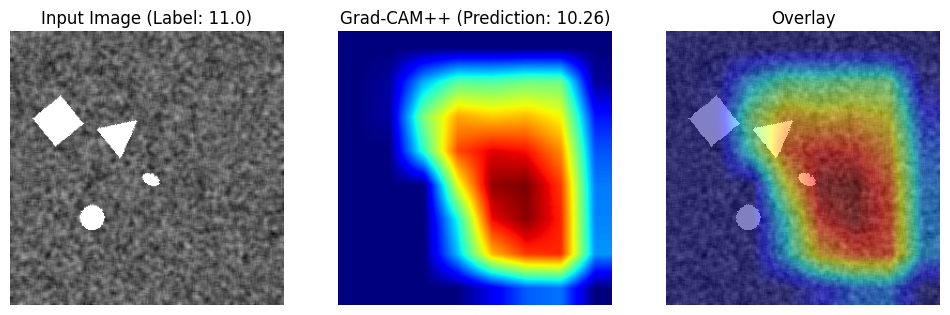

Min value in heatmap before ReLU is: tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward0>)
Max value in heatmap after ReLU is zero3.


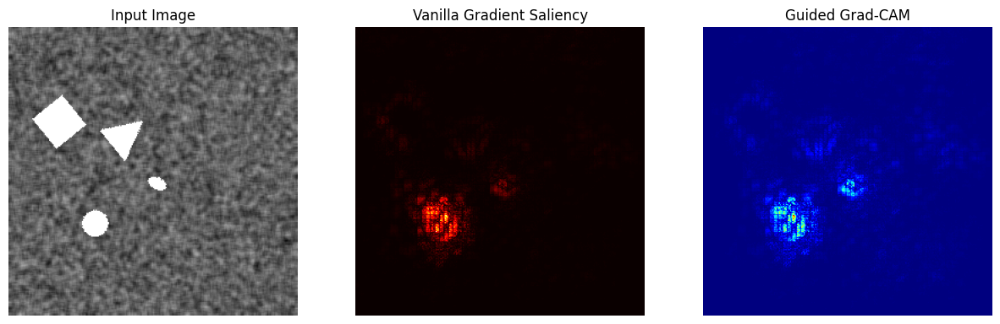

<Figure size 640x480 with 0 Axes>

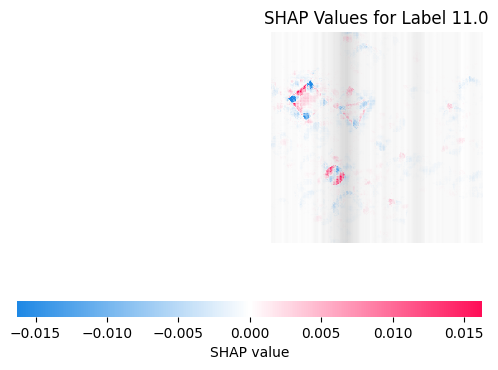

Image 4


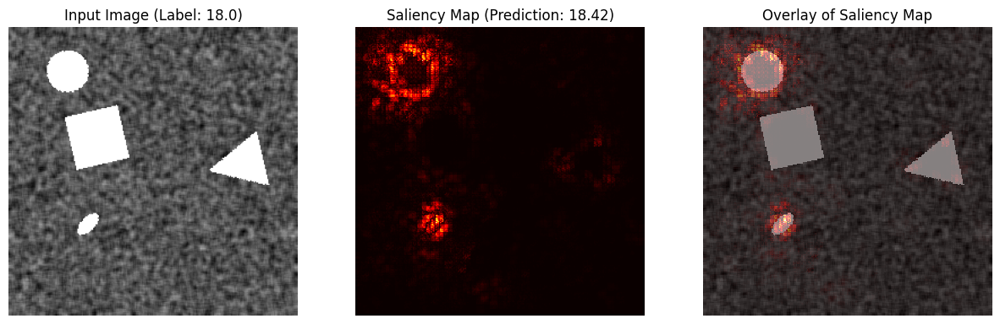

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


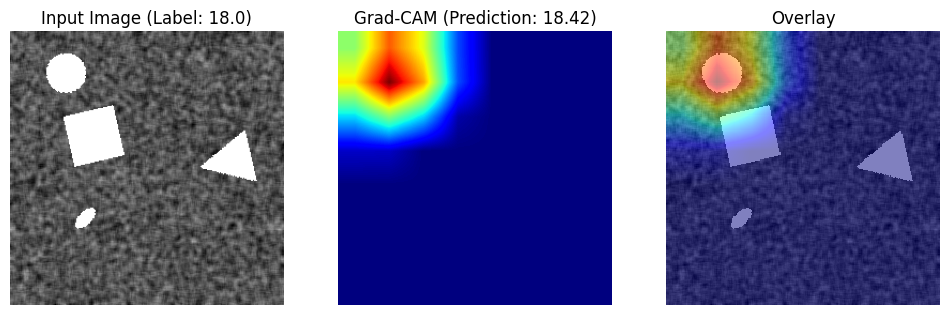

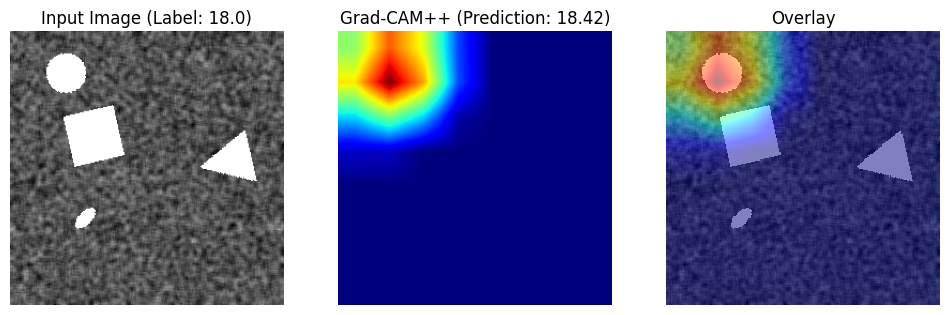

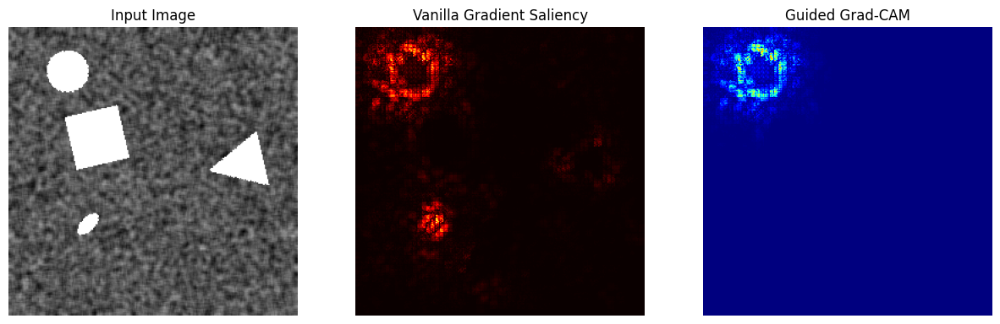

<Figure size 640x480 with 0 Axes>

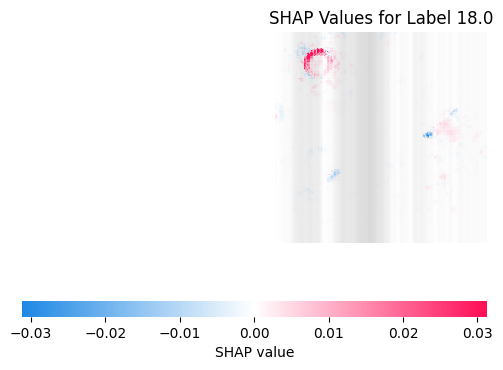

Image 5


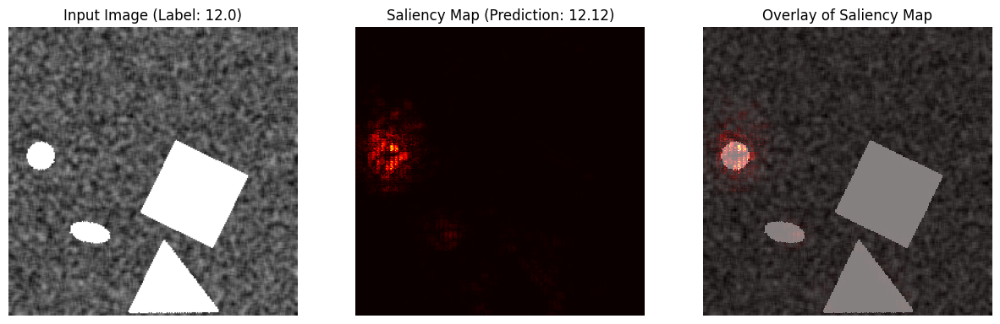

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


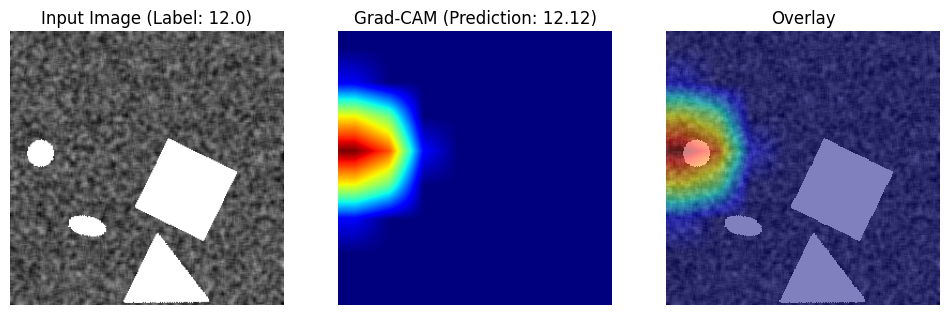

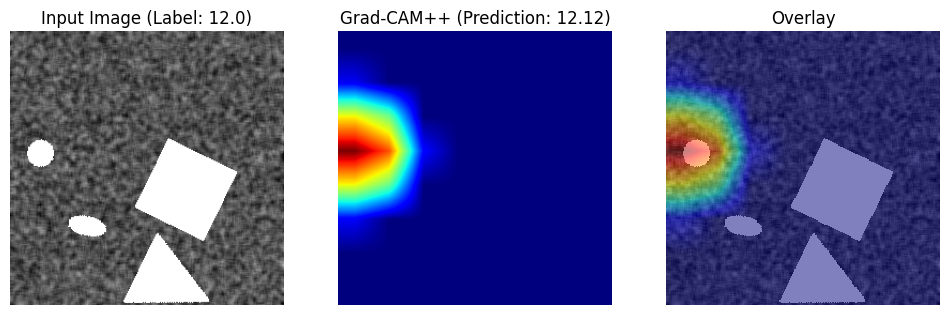

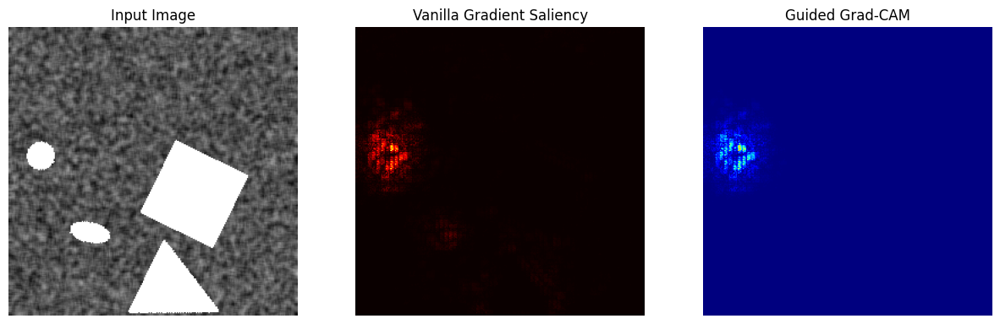

<Figure size 640x480 with 0 Axes>

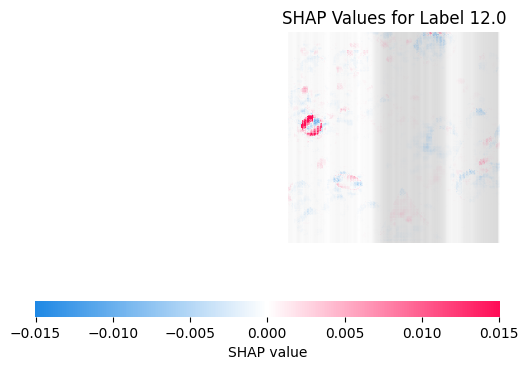

Image 6


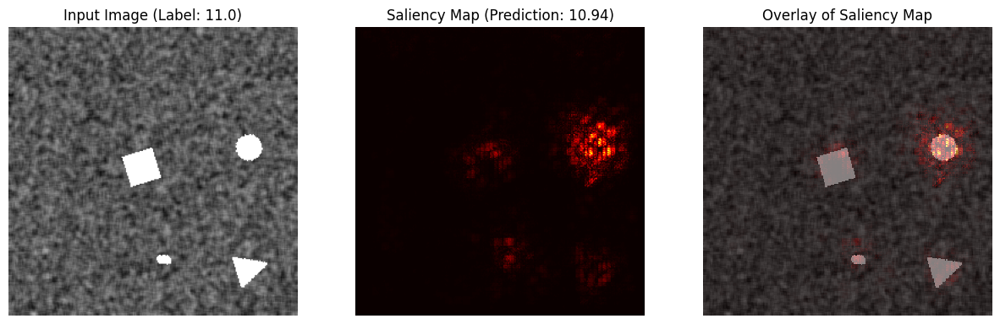

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


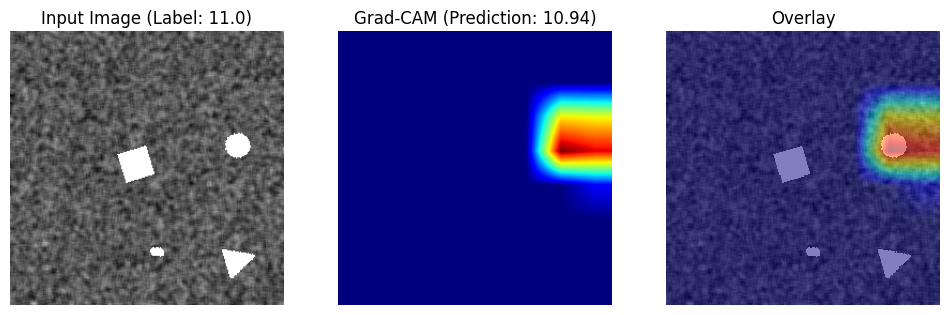

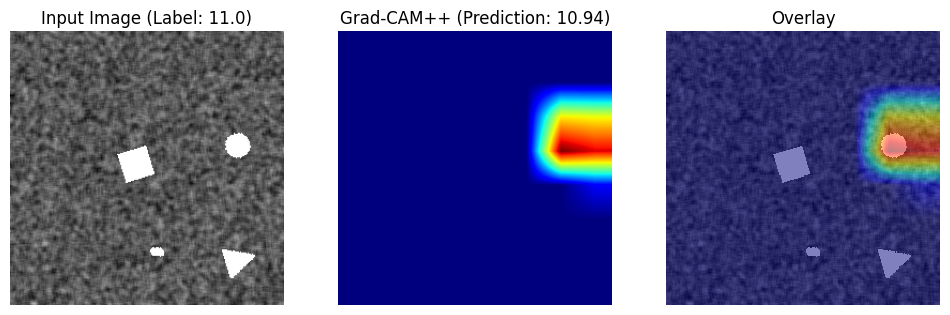

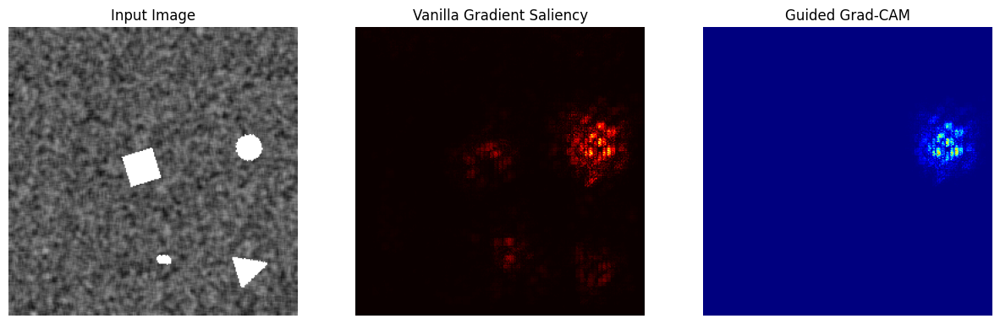

<Figure size 640x480 with 0 Axes>

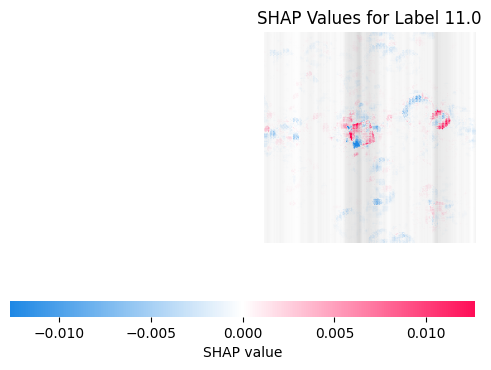

Image 7


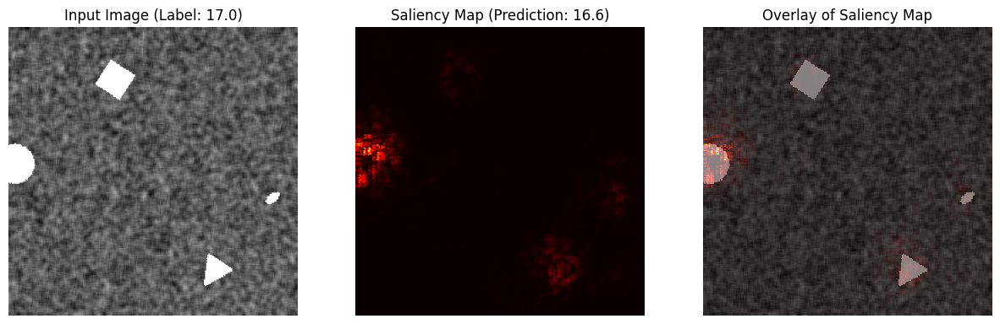

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


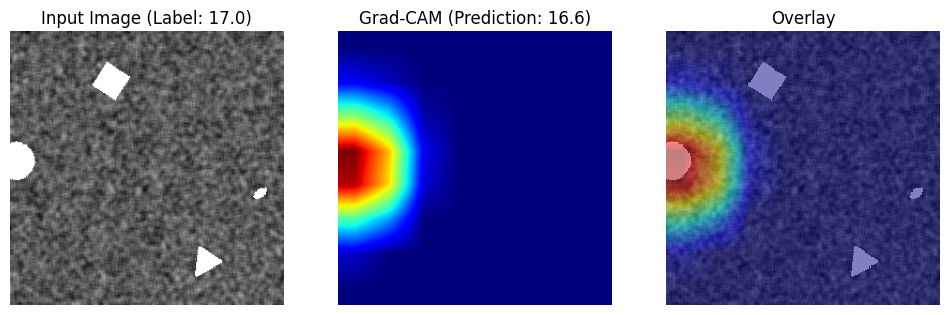

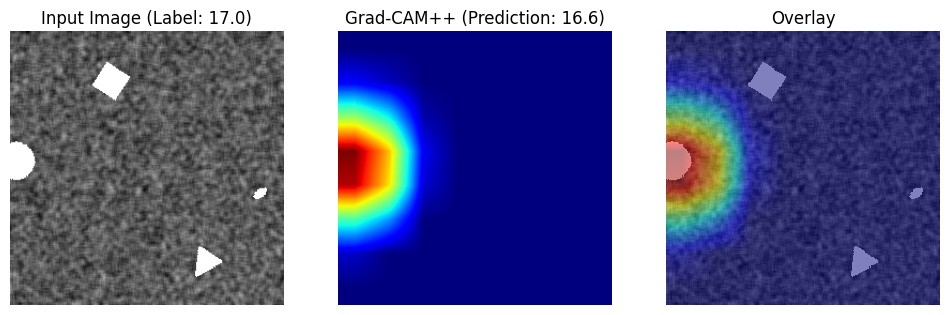

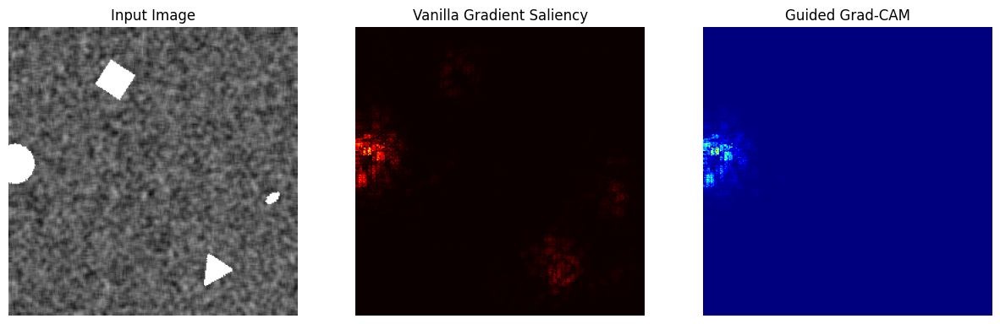

<Figure size 640x480 with 0 Axes>

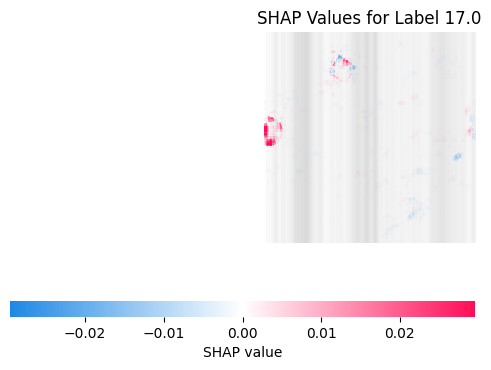

Image 8


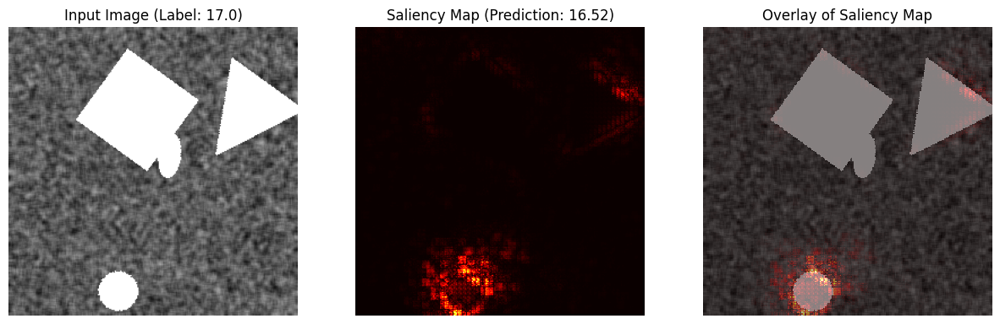

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


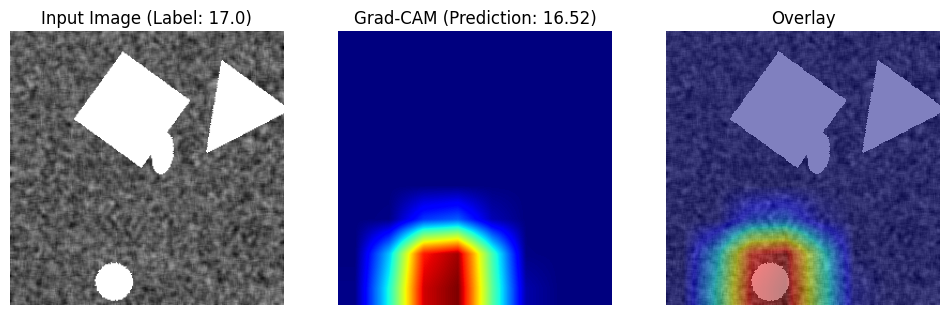

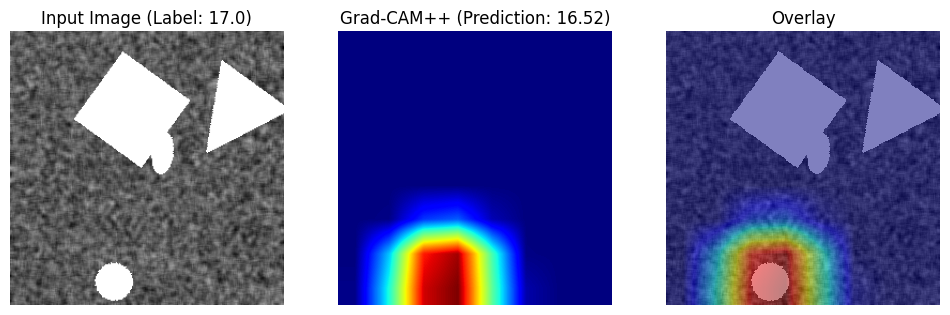

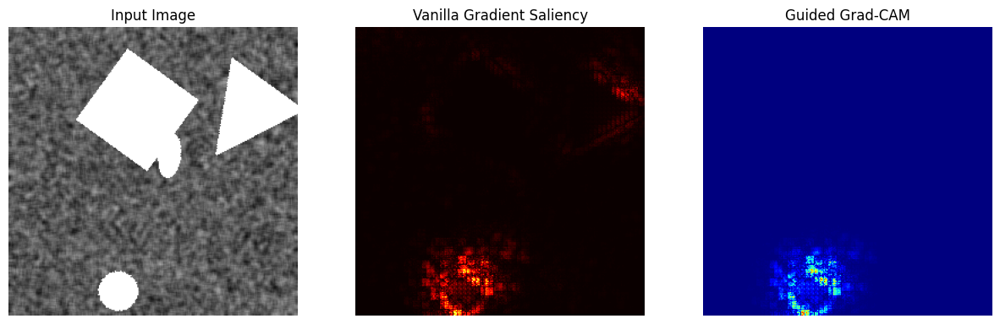

<Figure size 640x480 with 0 Axes>

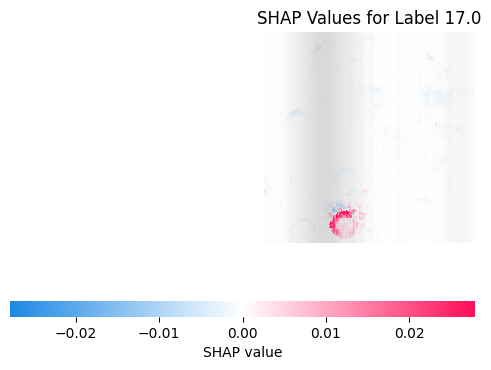

Image 9


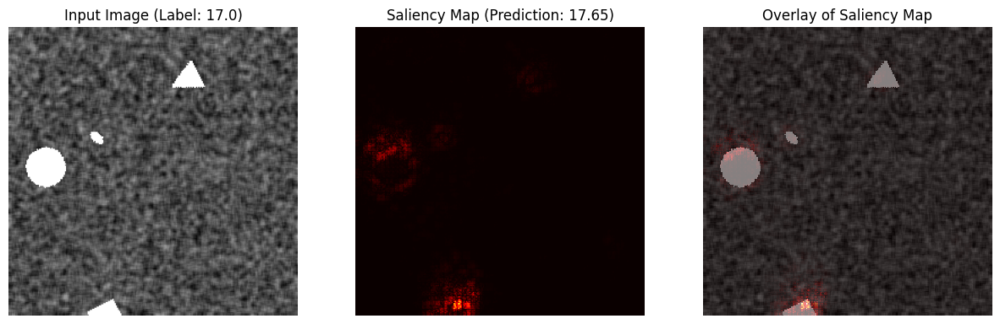

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


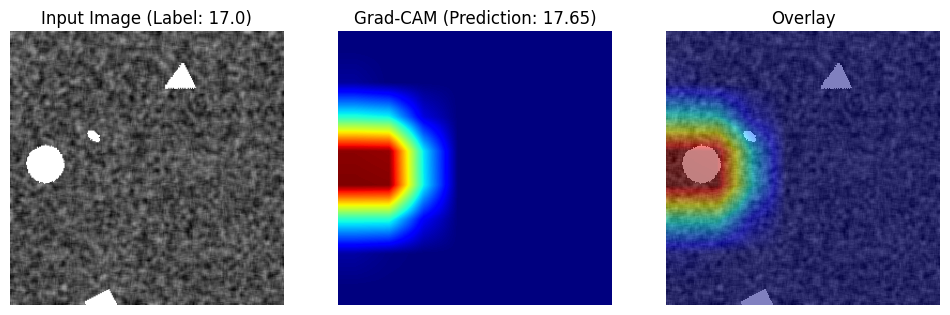

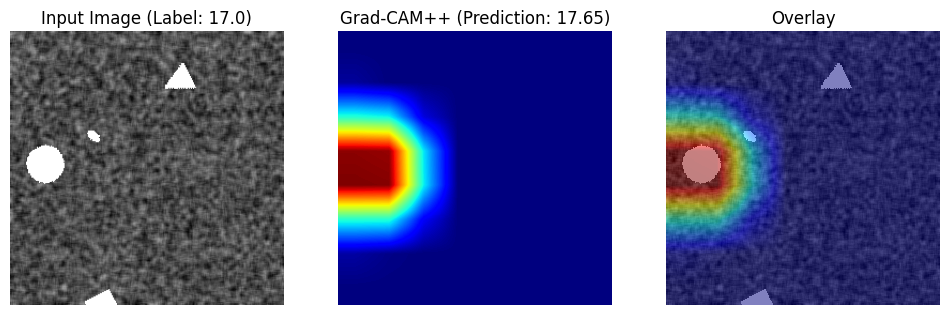

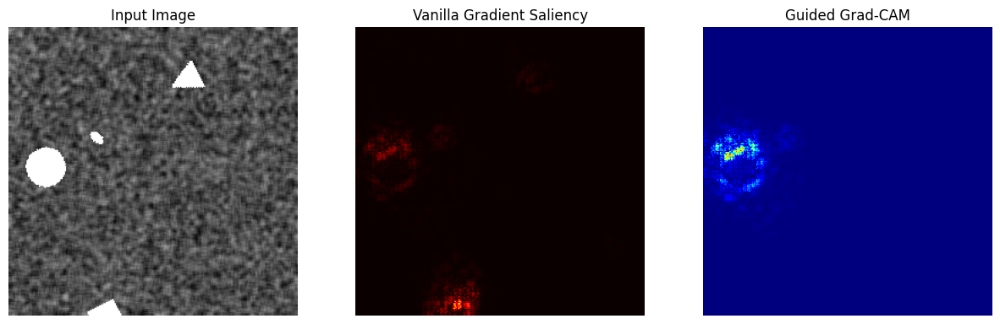

<Figure size 640x480 with 0 Axes>

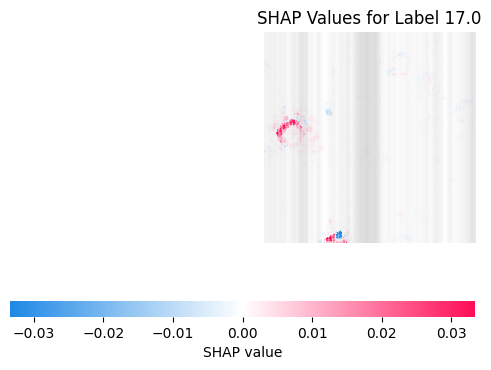

Image 10


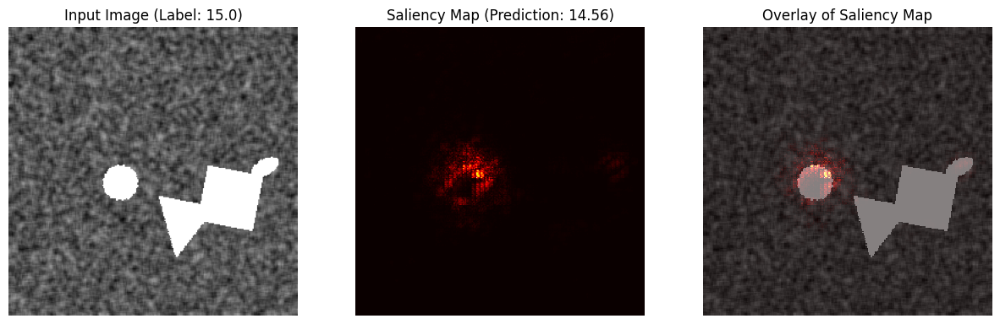

c:\Users\askel\anaconda3\envs\MLA\Lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


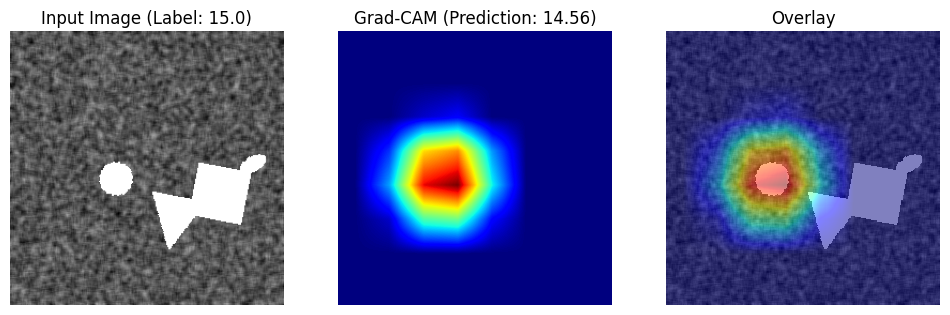

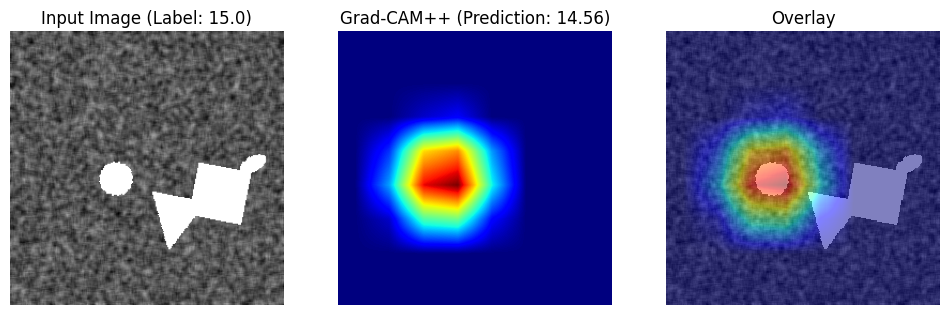

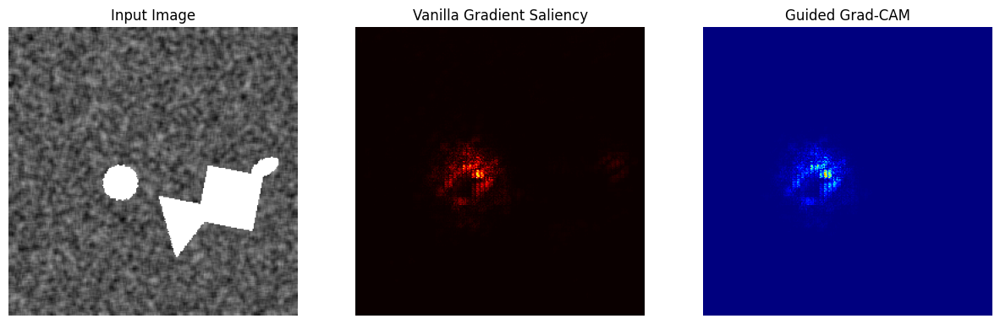

<Figure size 640x480 with 0 Axes>

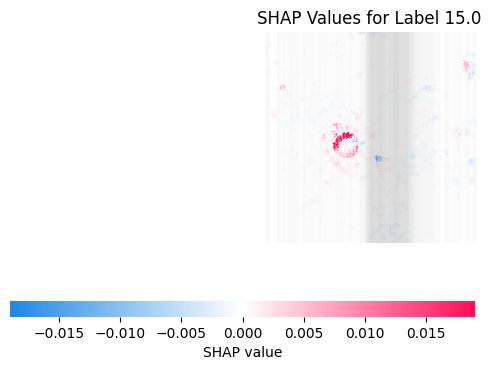

In [18]:
for i in range(10):
    for model in allModels:
        model.generate_map(i, save_output=True, save_dir="test_save")

Saving image
save name:  outputs/GradCamResnet/test_save/0_grad_cam_18.0.png


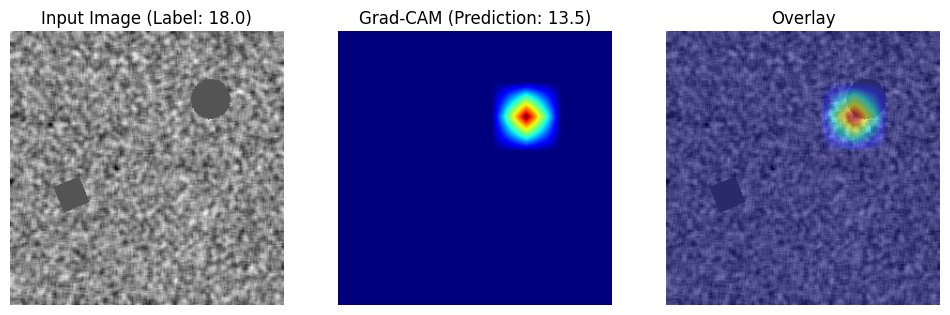

Min value in heatmap before ReLU is: tensor(0.0014, device='cuda:0', grad_fn=<AbsBackward0>)
Max value in heatmap after ReLU is zero3.
Saving image
save name:  outputs/GradCamResnet/test_save/1_grad_cam_9.0.png


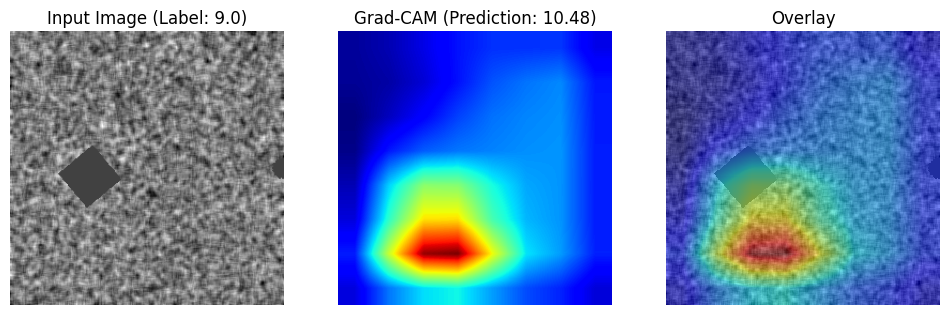

In [113]:
# display guided grad cam
for i in range(2):
    grad_cam.generate_map(i, save_output=True, save_dir="test_save")